# Classify architecture type from an image of a home

In [1]:
# Need to run `PYTORCH_ENABLE_MPS_FALLBACK=1 jupyter notebook` before loading this notebook
# there is an error that pops up later with augmentation that I couldn't figure out how to change while in the notebook.

# Suppress warnings from PyTorch
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")

# fastai V1 library which sits on top of Pytorch 1.0
from fastai.vision import *

import requests

from bs4 import BeautifulSoup

from fastai.vision.all import *
from fastai.vision import *

# import my custom functions
from src.utils import _label_func

import pandas as pd
import matplotlib.pyplot as plt



In [ ]:
# automatically download photos on this website (should be 9 photos)
# https://dghistory.org/american-foursquares/


## Look at results

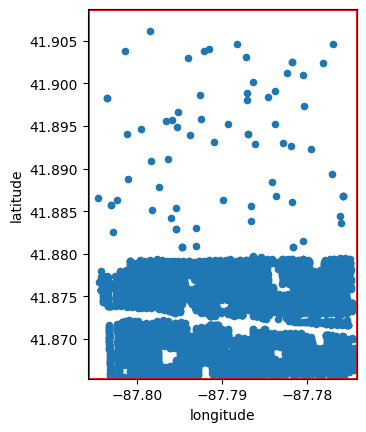

In [2]:
# now I need to find out how to extract data...
# soup.contents

# ok- thinking about this
# according to xx there are 25000 homes in Oak Park
# on redfin, there are ~3000 in last 5 years

# TODO make sure my scraping script is outputting home metadata correctly

# load redfin metadata
rf_metadata = pd.read_csv('data/interim/redfin_metadata.csv')

# Fill NaN values with a placeholder integer (e.g., -1)
rf_metadata['property_id'] = rf_metadata['property_id'].fillna(-1).astype(int)

# Google maps coordinates of bounding box for Oak Park
uleft = 41.90872286303018, -87.80575098756486
lright = 41.86533629647352, -87.7741652965275

# Filter out homes that are not in Oak Park (based on google maps coordinates)
rf_metadata['in_oak_park'] = [1 if x['latitude'] < uleft[0] and x['latitude'] > lright[0] and x['longitude'] < lright[1] and x['longitude'] > uleft[1] else 0 for x in rf_metadata.to_dict(orient='records')]
rf_metadata = rf_metadata[rf_metadata['in_oak_park'] == 1]

# Plot the latitude and longitude of the homes
rf_metadata.plot(kind='scatter', x='longitude', y='latitude')

# Draw rectangle for Oak Park
plt.gca().add_patch(plt.Rectangle((uleft[1], lright[0]), lright[1] - uleft[1], uleft[0] - lright[0], 
                                  edgecolor='r', facecolor='none', lw=2))

plt.xlim(min(rf_metadata['longitude'].min(), uleft[1]), max(rf_metadata['longitude'].max(), lright[1]))
plt.ylim(min(rf_metadata['latitude'].min(), lright[0]), max(rf_metadata['latitude'].max(), uleft[0]))

plt.gca().set_aspect('equal', adjustable='box')

## House image classifier

### Image loading setup

In [3]:
# get images for training the model
path = "/Users/chad/github/architecture/images/training"
fnames = get_image_files(path)

len(fnames) # 109 images


109

### Use image augmentation to increase training samples

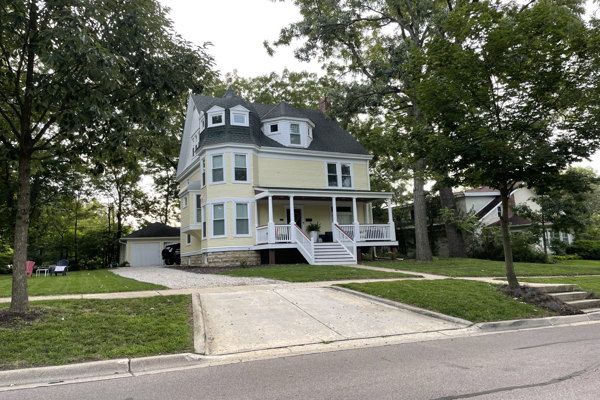

In [4]:
# single image of a house
img = PILImage(PILImage.create(fnames[0]).resize((600,400)))
img

In [5]:
# tensor.. ?
timg = TensorImage(array(img)).permute(2,0,1).float()/255.

In [6]:
# setup augmentation transforms of image
tfms = aug_transforms(pad_mode='zeros', mult=2, min_scale=0.75, do_flip=True, flip_vert=False, max_rotate=3, max_zoom=1.1,
                     max_lighting=0.2, max_warp=0.1, p_affine=0.75, p_lighting=0.5)

# NB: I took these parameters from an existing project on github-
# https://github.com/dumitrux/architectural-style-recognition/blob/master/src/architectural-style-recognition.ipynb
# tfms = get_transforms(do_flip=True, flip_vert=False, max_rotate=10, max_zoom=1.1, 
#                       max_lighting=0.2, max_warp=0.2, p_affine=0.75, p_lighting=0.75)
# NB: this get_transforms function is for the old fastai/pytorch versions so now I needed to use aug_transforms, as above


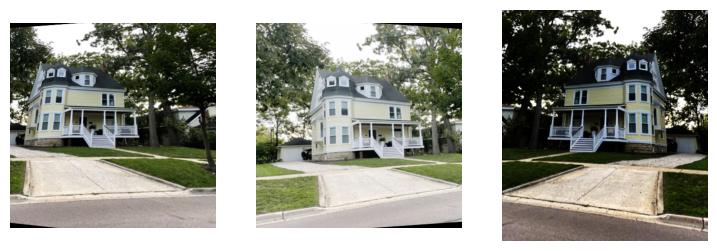

In [7]:
from fastai.vision.all import TensorImage

def _batch_ex(bs):
    return TensorImage(timg[None].expand(bs, *timg.shape).clone())

# plot some sample transformations
y = _batch_ex(9)
for t in tfms: y = t(y, split_idx=0)
_,axs = plt.subplots(1,3, figsize=(9,3))
for i,ax in enumerate(axs.flatten()): show_image(y[i], ctx=ax)

# save this image to a file
plt.axis('tight')
plt.savefig('reports/figures/warp.jpg')


In [8]:
# this way was using cap letter as labeler
# dls = ImageDataLoaders.from_name_func(path, files, label_func, bs=5, item_tfms=Resize(224), valid_pct=0.2)
# valid_pct is the percent of images used for validation

# this pulls the label from the file name (stuff before _ or -)
# dls = ImageDataLoaders.from_name_re(path, files, pat='^(.*)[_-].*?.jpg', item_tfms=Resize(224), bs=5)

# trying datablock instead
# here the subfolder name is used as the label
dblock = DataBlock(blocks = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y = parent_label,
                   splitter = RandomSplitter(valid_pct=0.2, seed=44),
                   item_tfms = Resize(224),
                   batch_tfms = tfms)

# does this help anything?
# batch_tfms = aug_transforms(size=224)
# load the data (batch size 5 minimum)
dls = dblock.dataloaders(path, bs=12)

/Users/chad/github/architecture/env/lib/python3.10/site-packages/torch/_tensor.py:1437: UserWarning: The operator 'aten::_linalg_solve_ex.result' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/mps/MPSFallback.mm:13.)
  ret = func(*args, **kwargs)


NB: this spits out a pytorch warning, but it seems to work still

In [9]:
# show the data
'train:', len(dls.train.items), 'valid:', len(dls.valid.items)

('train:', 88, 'valid:', 21)

In [10]:
print("Training images:\n", [x.stem for x in dls.train.items], "\n")
print("Validation images:\n", [x.stem for x in dls.valid.items])

Training images:
 ['chicagobungalow4', 'The-Thomas-Wells-House', 'chicagobungalow3', '2449FourSquare', 'YellowFourSquare', '4703-Highland-Ave', 'The-Campbell-House', 'The-Joseph-Moore-House-e1694963944109', 'shutterstock_1263296944', 'forest-ave-4815', '21635476-1', 'main3', 'red-victorian-home-wrap-around-porch-964fcce8-6d2ab8ee6f5b4d79941bd8866d1fb9ec', '5217-Fairmount-Ave-From-Google', 'The-Mitchell-Heintz-House', 'The-Gerardus-J.-Verbeck-House', 'The-Hanson-House', 'The-A.C.-Riddler-House', 'The-Darnley-House', 'CH32FEAWIL_LuxeDryED_0110-fit=constrain&wid=2560&hei=1440', 'portland-foursquare-home', 'GettyImages-165432736-scaled', 'The-Ella-Beaudette-House-gray', 'abf48490bbdb4d68efe381f71b11336b', 'chicagobungalow5', 'Maple-Ave-1323-2', 'The-Reideler-House', '701-maple-ave-herring-house', '710-maple-ave-cole-house', 'framebungalow', 'chicagobungalow8', 'XL_11792_bigrock_winter07', 'what-is-a-bungalow', 'prairie_751ClintonPl', 'IMG_4992-scaled', 'victorian-home_window-world-hero_198

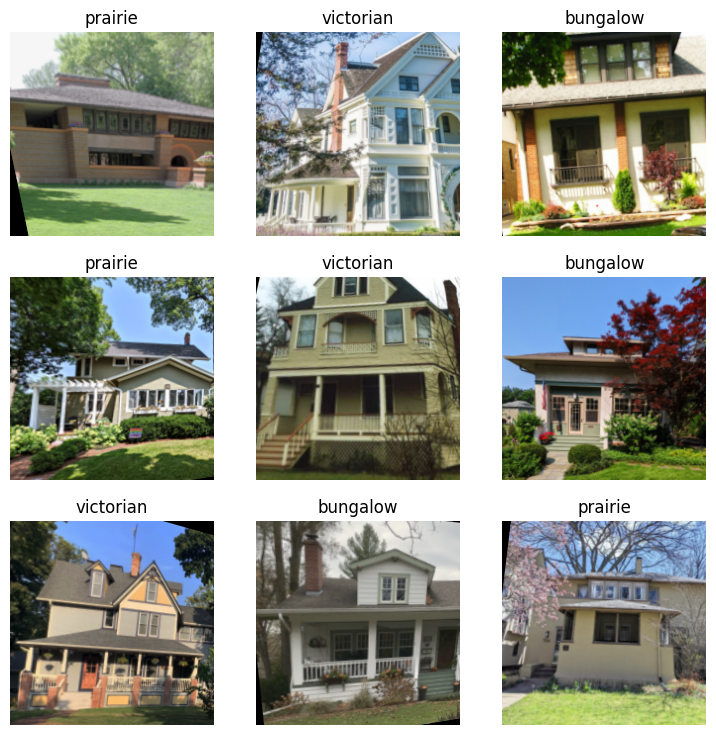

In [11]:
dls.show_batch()

In [18]:
# train the model
learn = vision_learner(dls, resnet34, metrics=error_rate)
# NB this was using ~6 cores on my local machine (macbook)

/Users/chad/github/architecture/env/lib/python3.10/site-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=de

SuggestedLRs(valley=0.0014454397605732083)

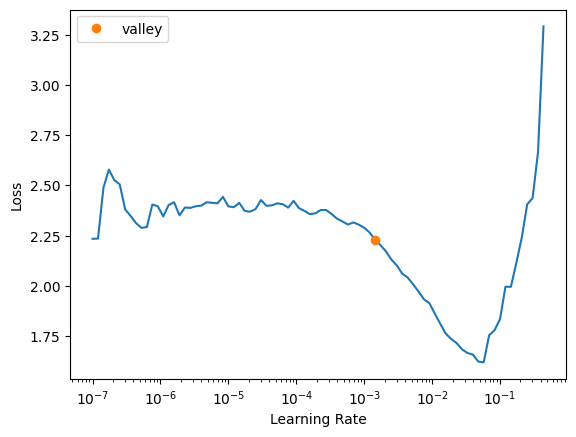

In [19]:
# ?? find optimal parameters for fine-tuning the model
# Find optimal learning rate
learn.lr_find()

In [20]:
# fine tune the learner
learn.fine_tune(6, 0.0014)

epoch,train_loss,valid_loss,error_rate,time
0,2.319132,2.544062,0.904762,00:05


epoch,train_loss,valid_loss,error_rate,time
0,1.990779,1.570399,0.571429,00:05
1,1.680720,0.877329,0.333333,00:05
2,1.449686,0.495076,0.190476,00:05
3,1.191990,0.476439,0.142857,00:05
4,0.982183,0.481279,0.142857,00:05
5,0.901256,0.429929,0.095238,00:05


Getting pretty decent performance (~85% accuracy) with only this very limited image set

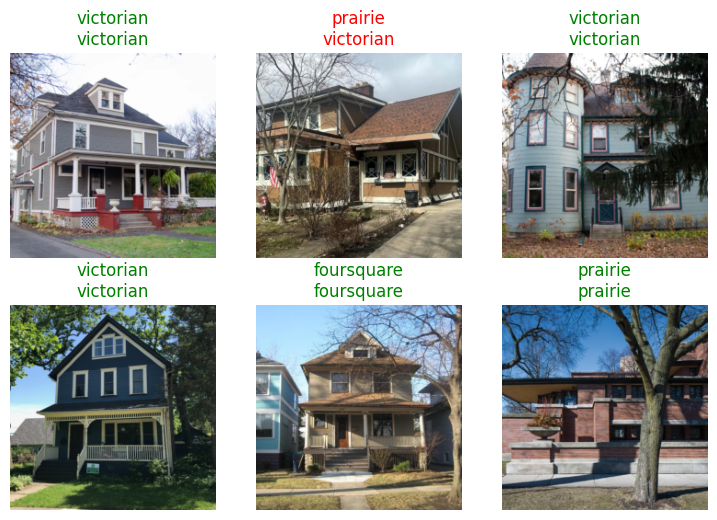

In [21]:
learn.show_results(max_n=6)
plt.savefig('reports/figures/learn_results.png')

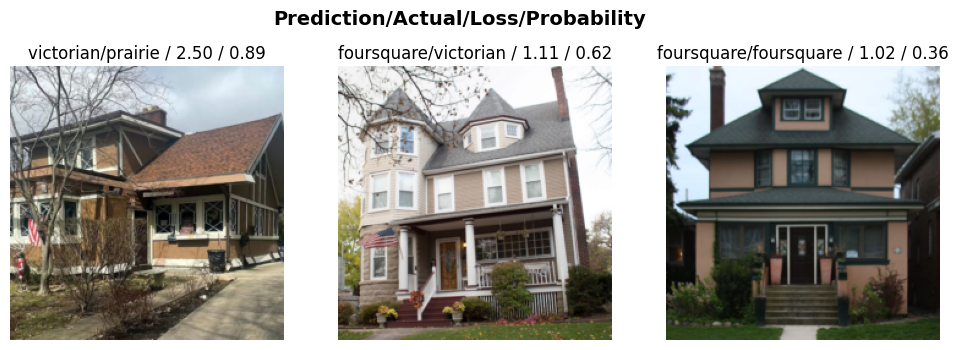

In [23]:
# find the images that give the most problems
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(3, figsize=(12,4))

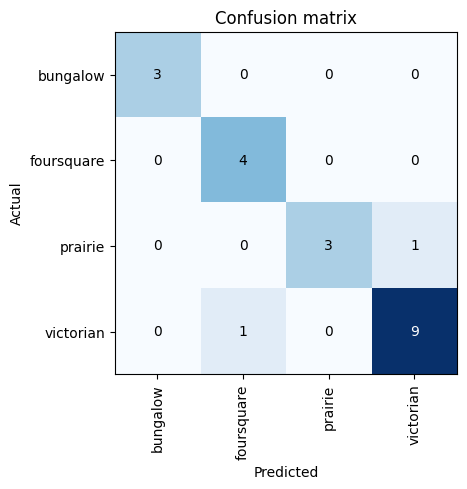

In [24]:
# look at confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()
plt.savefig('reports/figures/confusion_matrix.png')

From this, we can see that bungalows, foursquares, and prairie-style homes all kind of blend together.

### Save and reload the final model

In [45]:
# learn.save('architecture_model')
# learn.load('architecture_model')

Path('models/architecture_model.pth')

## Predicting home types

### Using the trained model to predict house type from redfin images

In [25]:
# NB: takes 3 minutes for all 5000 images

import os
import pandas as pd

# Get list of file paths to the test images
test_images = get_image_files('images/testing')

df_preds = pd.DataFrame(columns=['image', 'prediction', 'probability'])

# Load and predict on each test image
for img_path in test_images:

    img = PILImage.create(img_path)

    pred, _, probs = learn.predict(img)

    # Get the basename of the first test image path
    nm = os.path.basename(img_path)
    # Selecting top prediction based on max probability (e.g., `.max().item()`)
    df = pd.DataFrame({'image': nm, 'prediction': pred, 'probability': probs.max().item()}, index=[0])
    df_preds = pd.concat([df_preds, df])

# Get the property ID from the image name
df_preds['pid'] = df_preds['image'].str.extract(r'pid(\d+)', expand=False)

# Convert property ID to integer
df_preds['pid'] = df_preds['pid'].astype(int)



array([[<Axes: title={'center': 'probability'}>]], dtype=object)

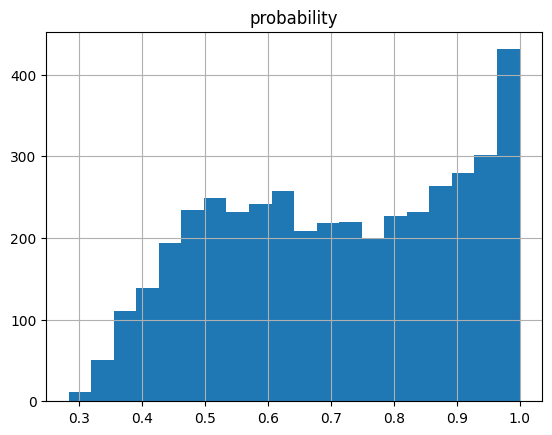

In [26]:
df_preds.hist(column='probability', bins=20)
# df_preds.boxplot(column='probability', by='prediction')


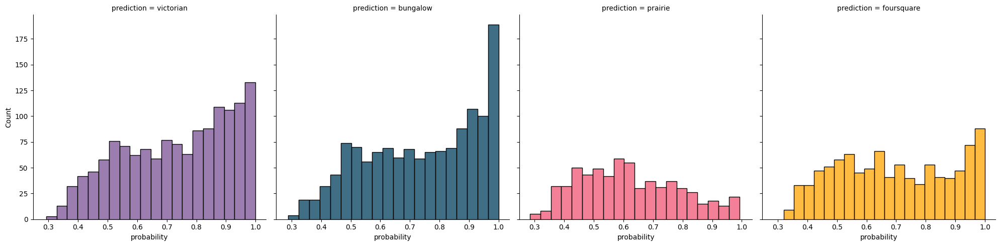

In [27]:
import seaborn as sns

# Get color classes for plotting later
prediction_colors = {'bungalow': '#003f5c', 'victorian': '#7a5195', 'prairie': '#ef5675', 'foursquare': '#ffa600'}

g = sns.FacetGrid(data=df_preds, col='prediction', col_wrap=4, height=5, hue='prediction', palette=prediction_colors)

g.map(sns.histplot, 'probability', bins=20, kde=False)
plt.savefig('reports/figures/probability_hist.png')


### Create map of architectural diversity by block

In [28]:
import seaborn as sns

# TODO plot a heatmap of the architectural diveristy by neighborhood

# Extract the relevant part of the image name using regex
# df_preds['extracted'] = df_preds['image'].str.extract(r'(\d+-\w+-\w+-\w+)', expand=False)
# df_preds['extracted'].values[0]

df_merged = df_preds.merge(rf_metadata, left_on='pid', right_on='property_id')

df_merged.to_csv('data/processed/rf_predictions.csv', index=False)

# TODO calculate architecture diversity by neighborhood

# Plot scatter of latitude and longitude with color as prediction
# sns.scatterplot(data=df_merged, x='longitude', y='latitude', hue='prediction')

<Axes: >

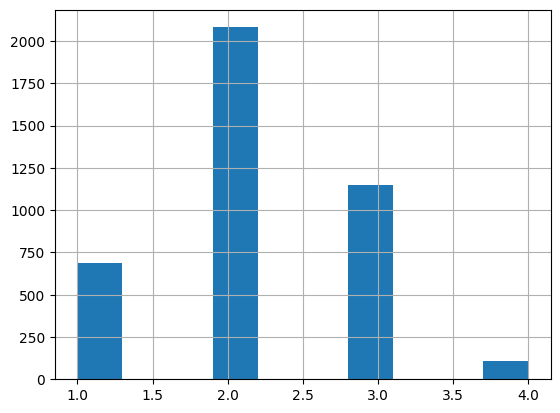

In [205]:
# Count up the number of distinct houses in a given radius

from sklearn.neighbors import NearestNeighbors

# conversion from meters to degrees
# 1 degree of latitude = 111 km
# assuming homes are 10 meters apart, 10/111000 = 0.00009 degrees

# Define the radius (in degrees, approximate for small distances)
radius = 0.0002  # adjust if needed, this is about 20 meters

# Initialize NearestNeighbors with the specified radius
nbrs = NearestNeighbors(radius=radius)

# Fit the model using latitude and longitude values for homes
nbrs.fit(df_merged[['latitude', 'longitude']].values)

# Function to calc. number of unique home types in a given radius
def count_unique_predictions_within_radius(row):
    # Find nearest neighbors within the radius
    indices = nbrs.radius_neighbors([row[['latitude', 'longitude']]], return_distance=False)[0]
    # Get the unique predictions
    unique_predictions = df_merged.iloc[indices]['prediction'].unique()
    return len(unique_predictions)

# Now we can apply the function to each row in the data frame-
df_merged['unique_predictions_in_radius'] = df_merged.apply(count_unique_predictions_within_radius, axis=1)

df_merged['unique_predictions_in_radius'].hist()

In [206]:
from scipy.interpolate import griddata
import numpy as np

import matplotlib.pyplot as plt

# Assuming x, y, and z are already defined
x = df_merged['longitude'].values
y = df_merged['latitude'].values
z = df_merged['unique_predictions_in_radius'].values
# z = np.hypot(x, y)  # Example z values, replace with actual data

# Define grid
grid_x, grid_y = np.mgrid[min(x):max(x):100j, min(y):max(y):100j]

# Interpolate using griddata
grid_z = griddata((x, y), z, (grid_x, grid_y), method='cubic')


In [36]:
# Load roads

import geopandas as gpd

# Import all roads NL
map_df = gpd.read_file('data/raw/roads/Street_Centerlines.shp')

# Convert from meters to lat/long
map_df = map_df.to_crs(epsg=4326)

In [29]:
# Remove apartments and condos
df_merged = df_merged[~df_merged['match'].str.contains('Unit|#')]

df_merged['prediction'].value_counts()

prediction
victorian     1268
bungalow      1241
foursquare     934
prairie        585
Name: count, dtype: int64

interpolation

summary stats

### Mapping "alpha" diversity of architectural styles
In this section, we will create a heatmap plot to visualize the density of different architectural styles in Oak Park, IL. This type of plot helps in understanding the spatial distribution and density of various house types in the area. Note: I am using the concept of alpha diversity borrowed from the field of ecology. The idea is that in a given 30m radius, diversity is the number of unique home styles in that area.

In [32]:
import os
import sys

# add the 'src' directory as one where we can import modules
src_dir = os.path.join(os.getcwd(), 'src') #os.pardir, 'src')
sys.path.append(src_dir)

%load_ext autoreload
%autoreload 2

from plot_map import find_unique, plot_arch_map

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


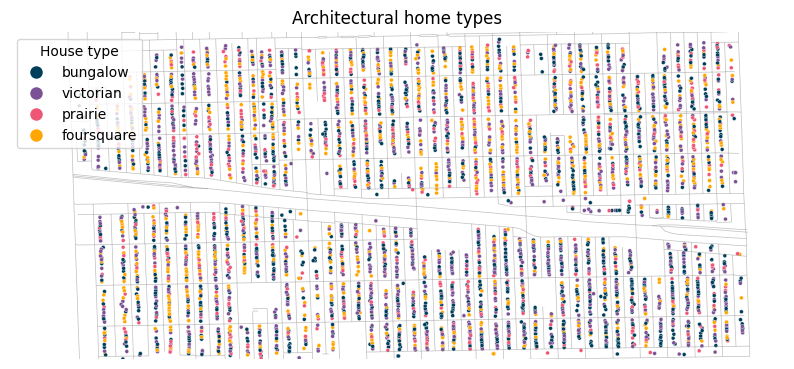

In [52]:
df_merged['unique_homes_in_radius'] = find_unique(df_merged, radius=0.0002)  # .0001 is about 10 meters

# Plot only home types
plot_arch_map(df=df_merged, cols=prediction_colors, plot_title='Architectural home types',
              file_name='reports/figures/arch_div_p00_r20_noHM.png', heatmap=False, road_col='gray')


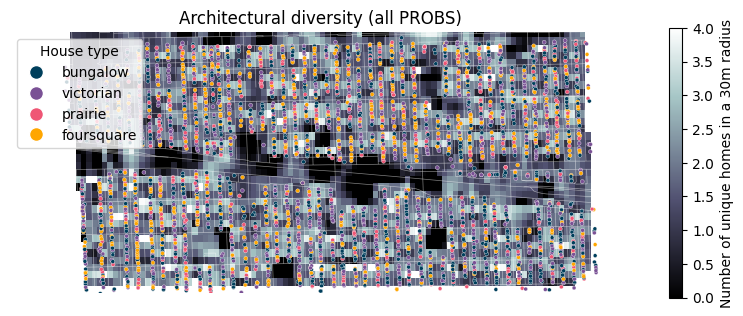

In [51]:
# Add in diversity layer
plot_arch_map(df=df_merged, cols=prediction_colors, plot_title='Architectural diversity (all PROBS)', file_name='reports/figures/arch_div_p00_r20.png', cmap='bone')


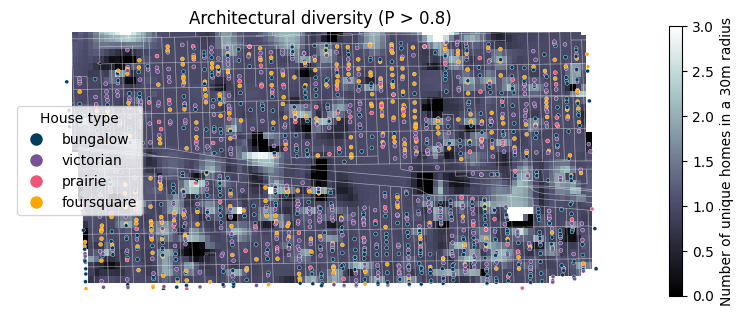

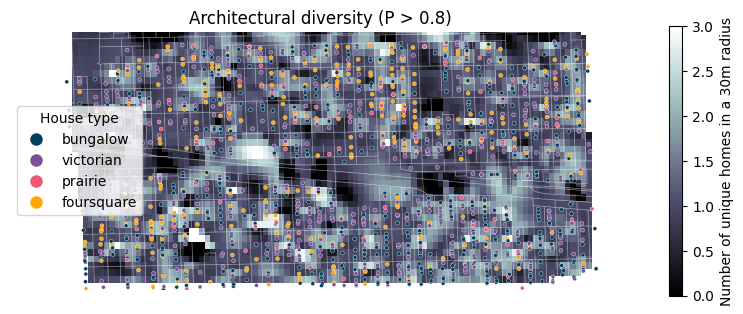

In [35]:
prediction_colors = {'bungalow': '#003f5c', 'victorian': '#7a5195', 'prairie': '#ef5675', 'foursquare': '#ffa600'}

# Create a new column for number of unique homes in a given radius
df_merged['unique_homes_in_radius'] = float('nan')

# Subset the data frame to include only high confidence predictions
idx = df_merged['probability'] > 0.8
plot_df = df_merged[idx]

# Plot with 10m radius
plot_df.loc[idx, 'unique_homes_in_radius'] = find_unique(plot_df, radius=0.0001)  # .0001 is about 10 meters
plot_arch_map(df=plot_df, cols=prediction_colors, plot_title='Architectural diversity (P > 0.8)', file_name='reports/figures/arch_div_p80_r10.png')

# Plot with 20m radius
plot_df.loc[idx, 'unique_homes_in_radius'] = find_unique(plot_df, radius=0.0002)  # .0002 is about 20 meters
plot_arch_map(df=plot_df, cols=prediction_colors, plot_title='Architectural diversity (P > 0.8)', file_name='reports/figures/arch_div_p80_r20.png')


<Axes: xlabel='prediction', ylabel='home_value'>

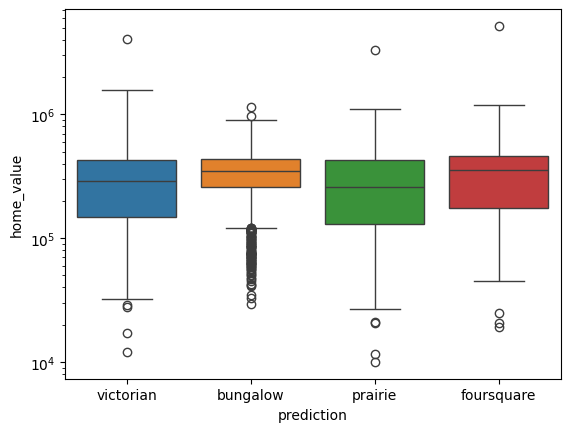

In [36]:
sns.boxplot(data=df_merged, x='prediction', y='home_value', hue='prediction', legend=False, log_scale=True)

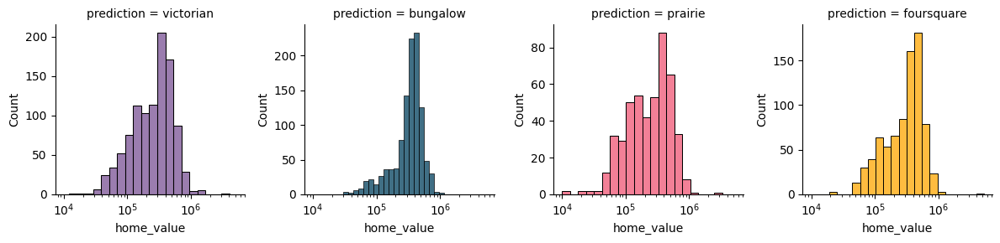

In [37]:
# Plot histograms of home values for each prediction
g = sns.FacetGrid(df_merged, col='prediction', col_wrap=4, sharey=False, hue='prediction', palette=prediction_colors)
g.map(sns.histplot, 'home_value', bins=20, log_scale=True)

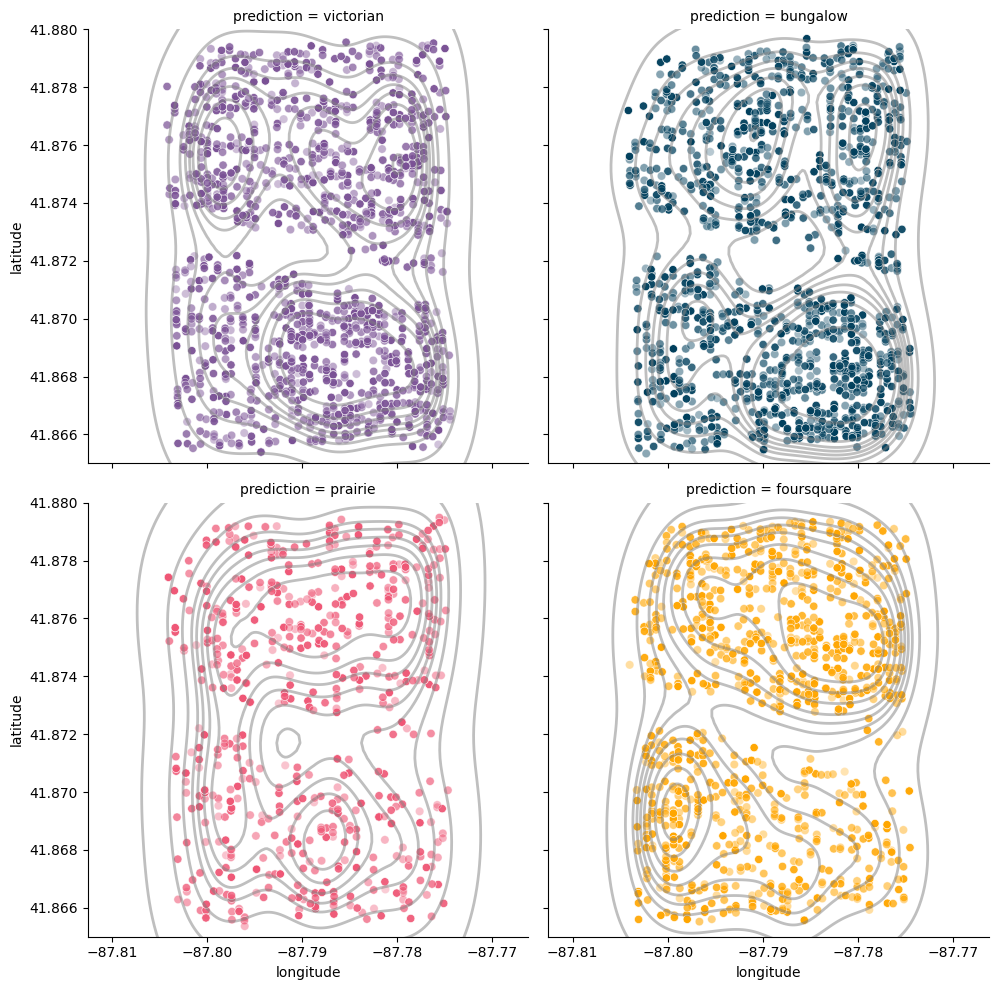

In [38]:
# Plot the distribution of different architectural home styles

g = sns.FacetGrid(df_merged, col='prediction', col_wrap=2, height=5, hue='prediction', palette=prediction_colors)

g.map(sns.scatterplot, 'longitude', 'latitude', alpha=df_merged['probability'])
g.map(sns.kdeplot, 'longitude', 'latitude', levels=10, color='gray', linewidths=2, alpha=0.5)

g.set(ylim=(41.865, 41.88))


In [39]:
df_merged['home_value'].notna().sum()
# 3401 homes have home values.. cool


3401

In [40]:
# Create dummy variables for logistic regression models
df_merged[['bungalow','foursquare','prairie','victorian']] = pd.get_dummies(df_merged['prediction'])

<Axes: xlabel='latitude', ylabel='foursquare'>

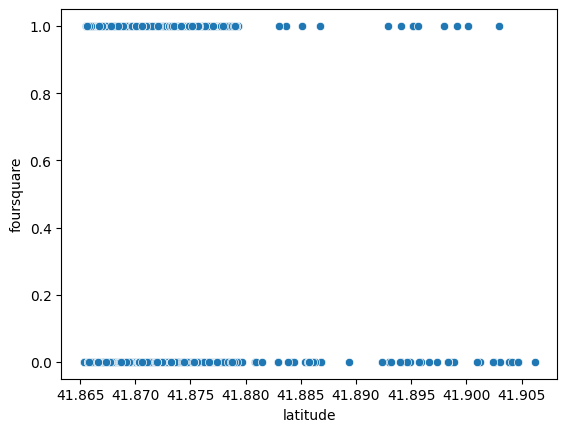

In [41]:
sns.scatterplot(data=df_merged, x='latitude', y='foursquare')
# sns.scatterplot(data=df_merged, x='latitude', y='prairie')
# plt.xscale('log')

In [42]:
from sklearn import linear_model

df_drop = df_merged.dropna(subset=['longitude','latitude','foursquare','home_value'])

y = df_drop['foursquare']
X = df_drop[['latitude']]

logr = linear_model.LogisticRegression(verbose=1)

logr.fit(X,y)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.10990D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      5      8      1     0     0   2.562D-06   5.452D-01
  F =  0.54516904928688104     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


LogisticRegression(verbose=1)

In [43]:
odds = np.exp(logr.coef_)
print(odds)


[[0.97221297]]


In [44]:
# logr.coef_
# dir(logr)
logr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 1,
 'warm_start': False}

n= 3401 features
r= -0.17 p= 0.0


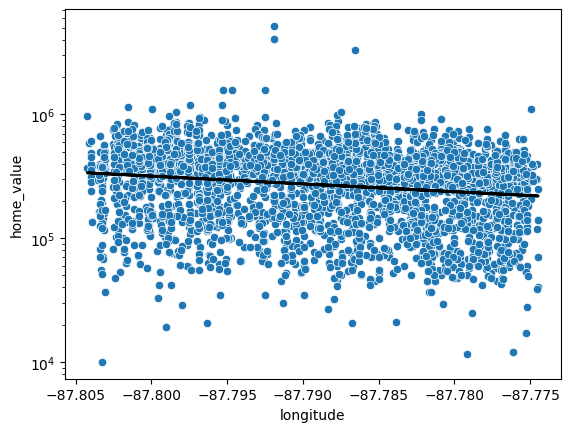

In [45]:
from scipy import stats

sns.scatterplot(data=df_merged, x='longitude', y='home_value')
# sns.scatterplot(data=df_merged, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

df_drop = df_merged.dropna(subset=['longitude','home_value'])

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# r = -0.15, P < 0.001
# there is a negative correlation between longitude and home value
# as we get further from the city (Chicago) center, home values INCREASE

# Residuals plot


# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='black', linewidth=2)

plt.savefig('reports/figures/home_value_regression.png')



n= 1100 features
r= -0.22 p= 0.0


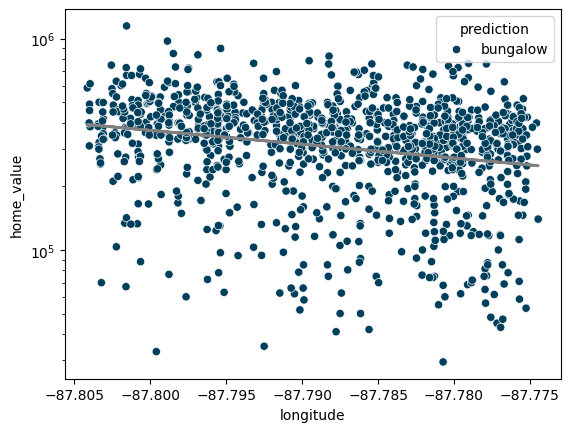

In [46]:
from scipy import stats

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'bungalow']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)


In [47]:
# Look at interaction longitude and architectural style
# Does home value always increase as we move further from the city center?

import statsmodels.api as sm
import statsmodels.formula.api as smf

df_drop = df_merged.dropna(subset=['longitude','latitude','home_value'])

# Fit a generalized linear model
model = smf.glm('np.log(home_value) ~ (latitude + longitude) + prediction', data=df_drop, family=sm.families.Gaussian())
fit = model.fit()

# We can see that none of the interactions are significant, so just latitude and longitude are important
fit.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:     np.log(home_value)   No. Observations:                 3401
Model:                            GLM   Df Residuals:                     3395
Model Family:                Gaussian   Df Model:                            5
Link Function:               Identity   Scale:                         0.45359
Method:                          IRLS   Log-Likelihood:                -3478.4
Date:                Mon, 07 Oct 2024   Deviance:                       1539.9
Time:                        11:49:36   Pearson chi2:                 1.54e+03
No. Iterations:                     3   Pseudo R-squ. (CS):            0.07992
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                -2132.0482    158.196    -13.477      0.000   -2442.107   -1821.989
prediction[T.foursquare]    -0.1215      0.031     -3.863      0.000      -0.183      -0.060
prediction[T.prairie]       -0.3537      0.037     -9.525      0.000      -0.426      -0.281
prediction[T.victorian]     -0.2508      0.029     -8.565      0.000      -0.308      -0.193
latitude                    19.5730      2.327      8.411      0.000      15.012      24.134
longitude                  -15.0946      1.422    -10.613      0.000     -17.882     -12.307
============================================================================================
"""

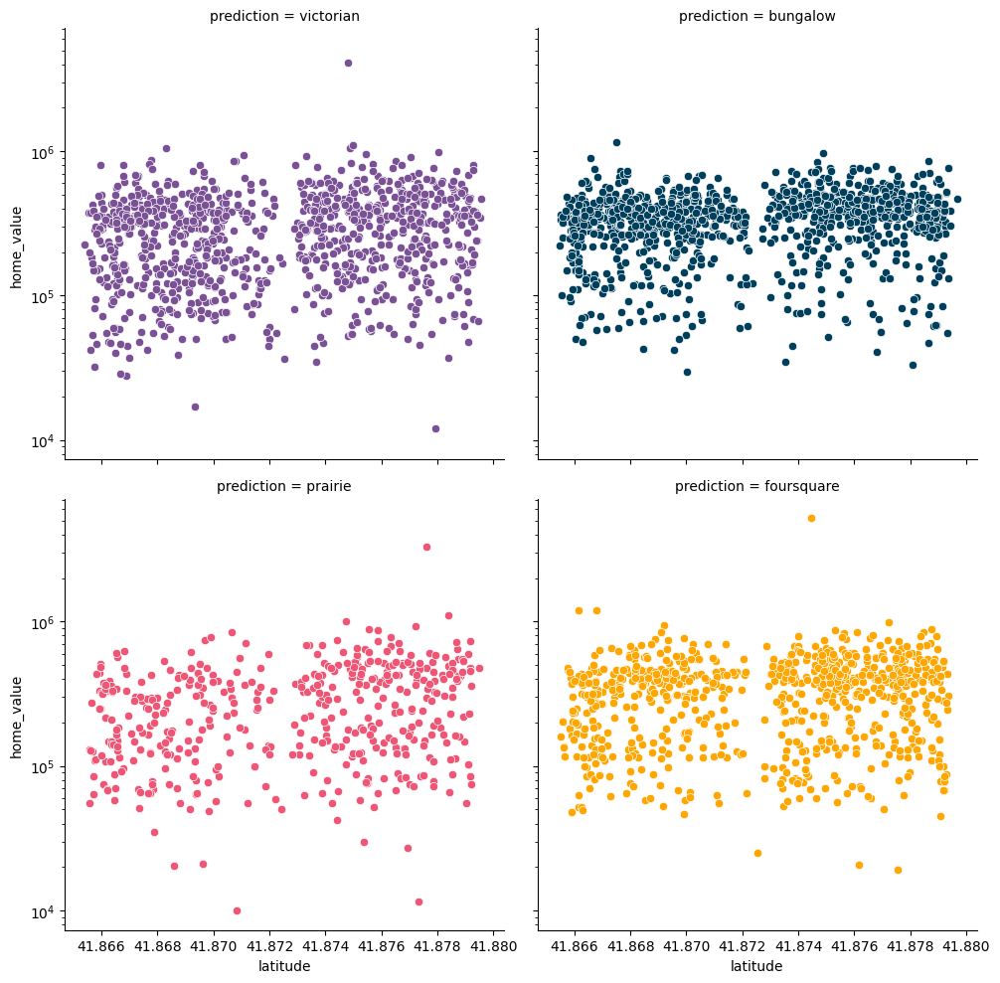

In [48]:
# Plotting the regression results

df_filter = df_drop[df_drop['latitude'] < 41.88]

g = sns.FacetGrid(df_filter, col='prediction', col_wrap=2, height=5, hue='prediction', palette=prediction_colors)

g.map(sns.scatterplot, 'latitude', 'home_value')
plt.yscale('log')

n= 799 features
r= -0.13 p= 0.0


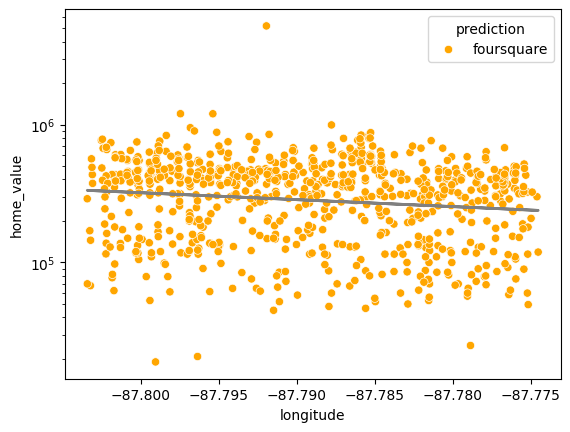

In [49]:
from scipy import stats

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'foursquare']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)


n= 476 features
r= -0.08 p= 0.079


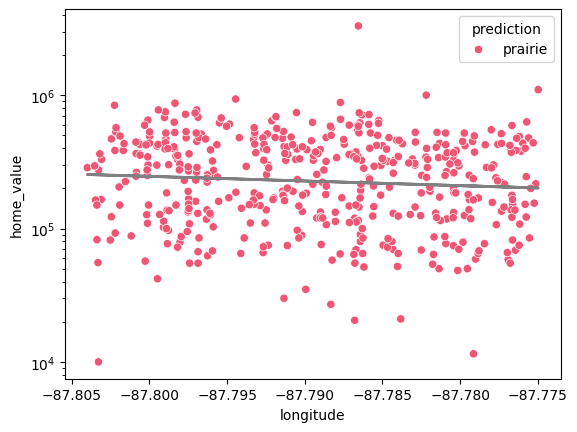

In [50]:
from scipy import stats

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'prairie']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)
